In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import gabor
import pandas as pd
from glob import glob
from skimage.feature import local_binary_pattern

Processing image 1: C:\Users\jithi\Downloads\images for intials\d47bf62b-98b7-434a-881f-0ad1db20315c___Matt.S_CG 6753.JPG


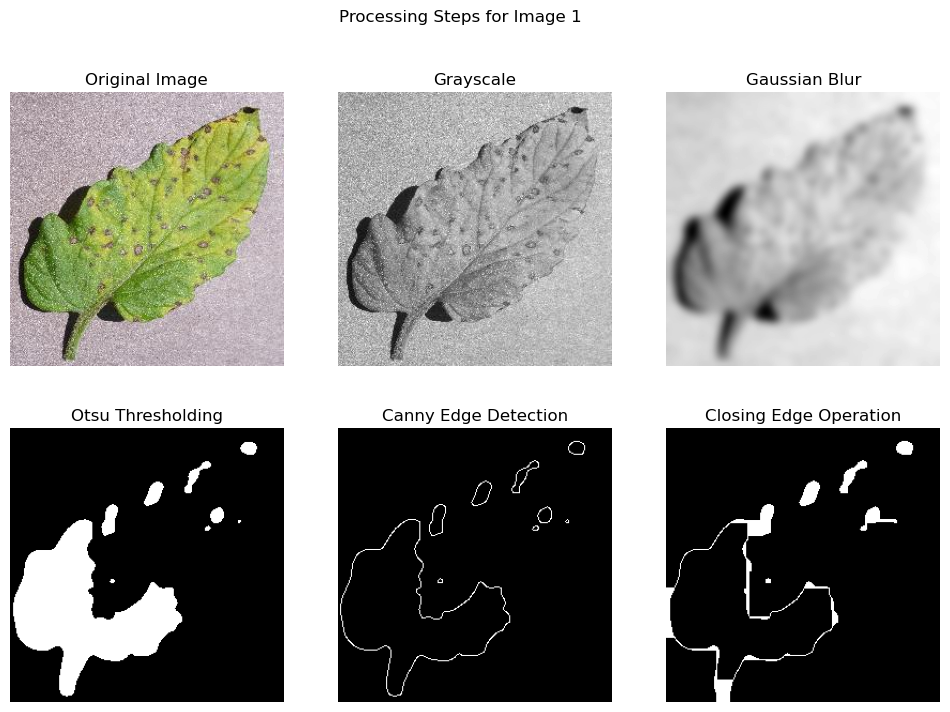

Processing image 2: C:\Users\jithi\Downloads\images for intials\d47c8ffb-e42f-4bad-a87a-0a902c75bbc9___Matt.S_CG 1255.JPG


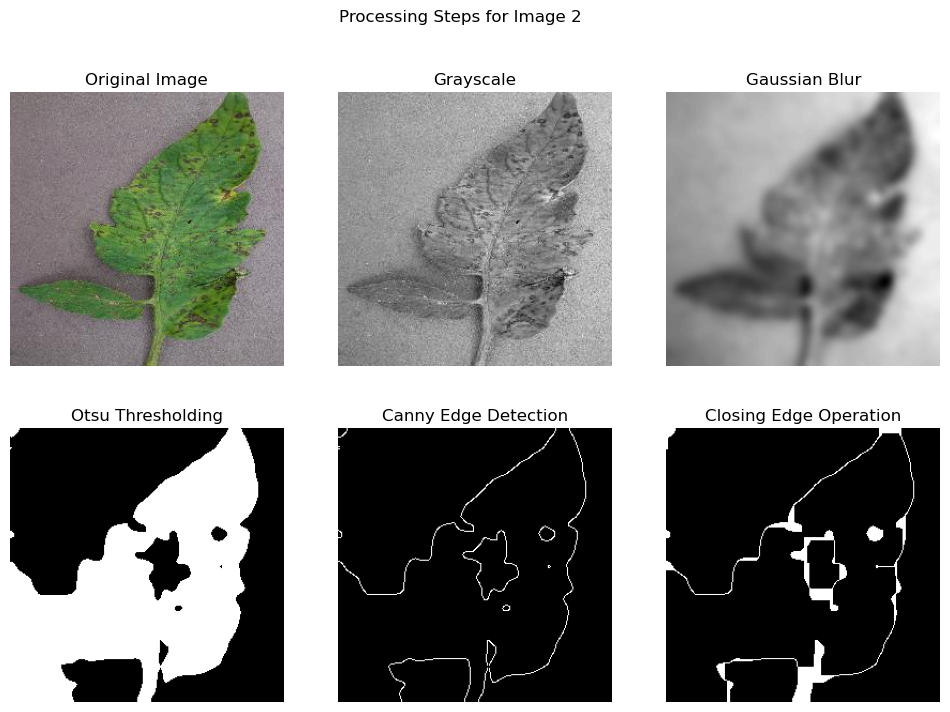

Processing image 3: C:\Users\jithi\Downloads\images for intials\d49f313e-910e-4386-a120-8b5e27dccb14___Matt.S_CG 2616.JPG


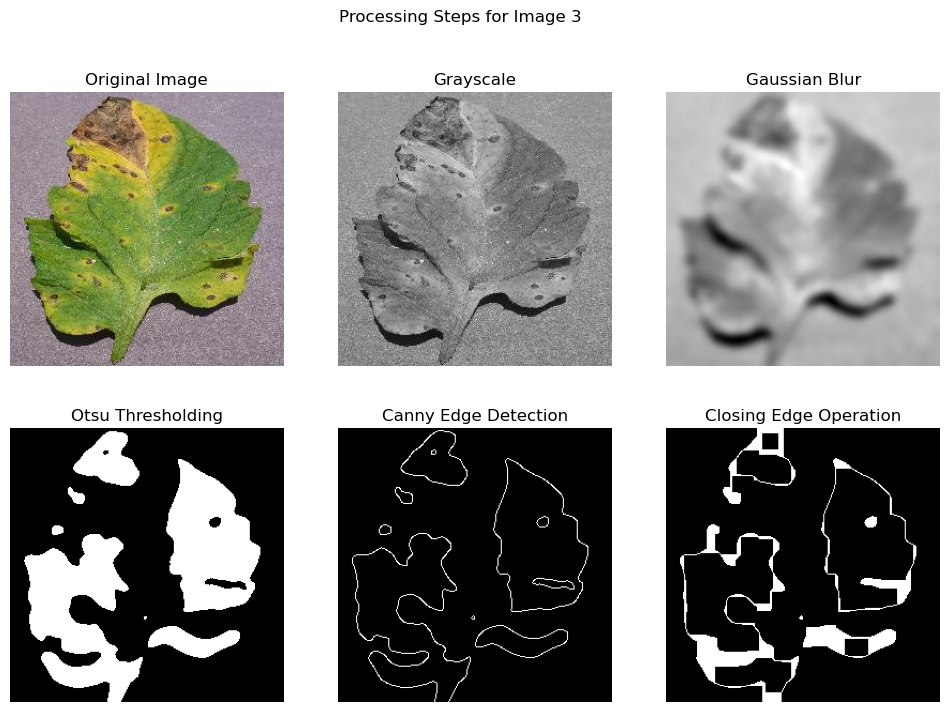

Processing image 4: C:\Users\jithi\Downloads\images for intials\eedd252b-1d20-4cc8-94ca-b8800334996c___GHLB2 Leaf 8667.JPG


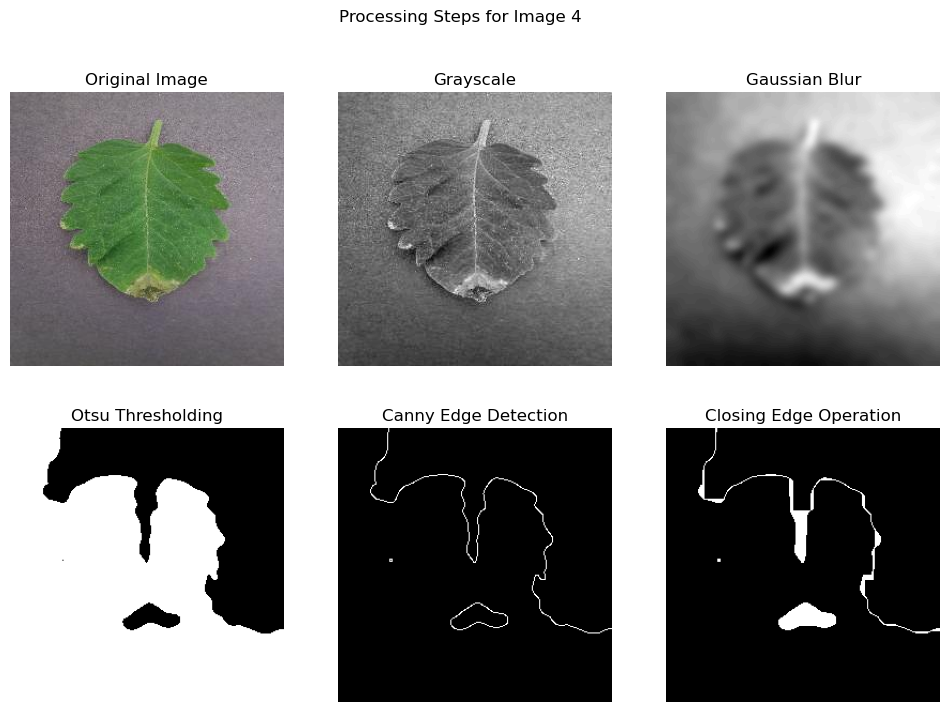

Processing image 5: C:\Users\jithi\Downloads\images for intials\eeea993c-d0eb-4f36-acf4-187e01dc6b72___RS_Late.B 6028.JPG


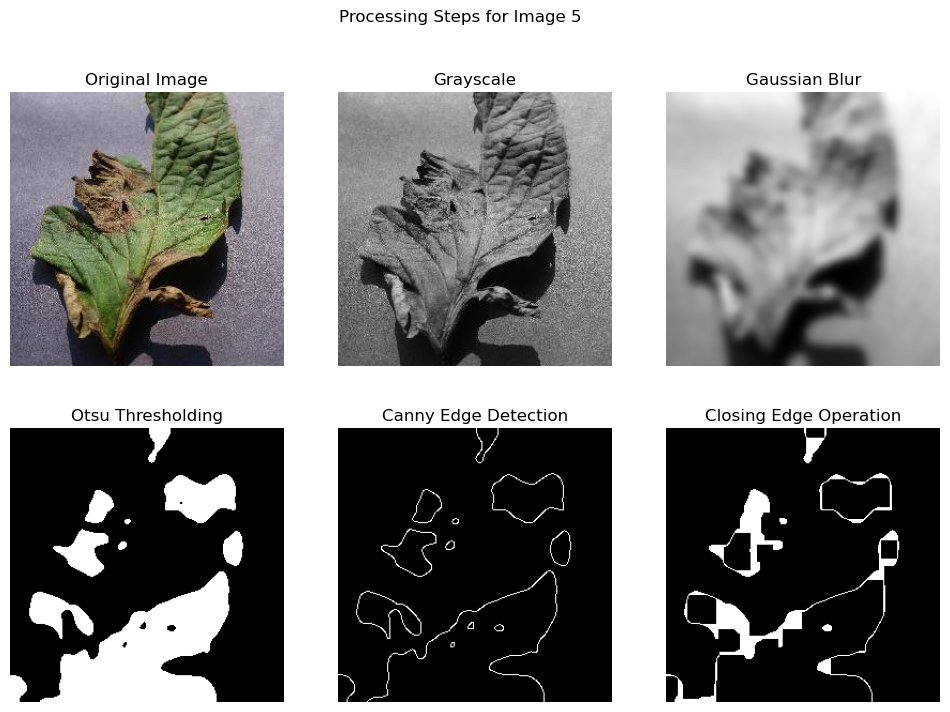

Processing image 6: C:\Users\jithi\Downloads\images for intials\ef5ac7be-8adc-4395-9a31-d970fb6e8c7a___RS_Late.B 4981.JPG


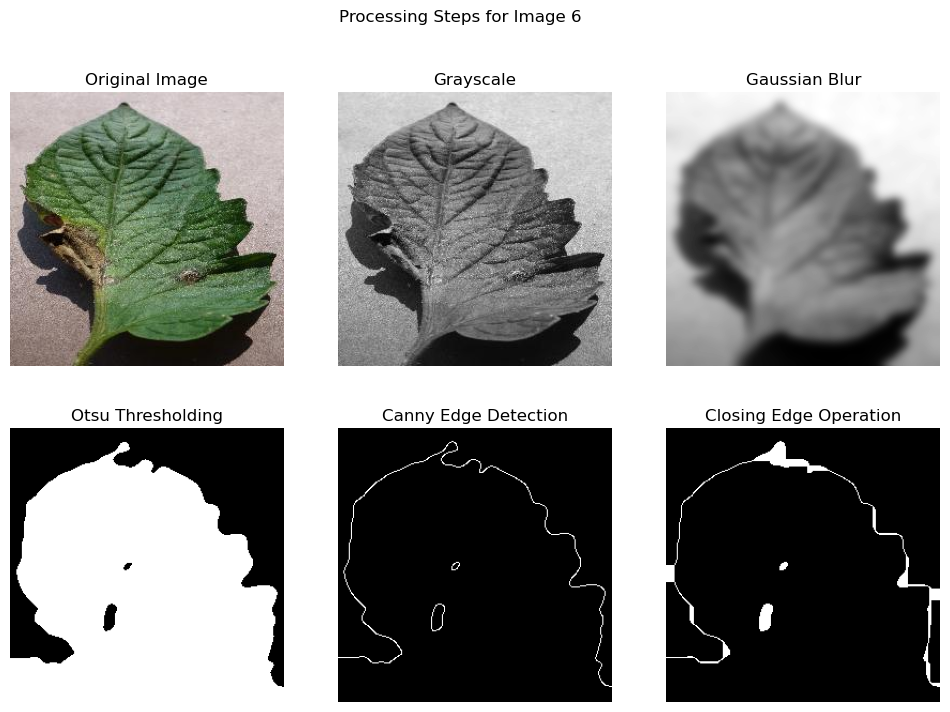

Processing image 7: C:\Users\jithi\Downloads\images for intials\f3d54943-501d-41ee-a07d-541dd03ff14c___Matt.S_CG 6802.JPG


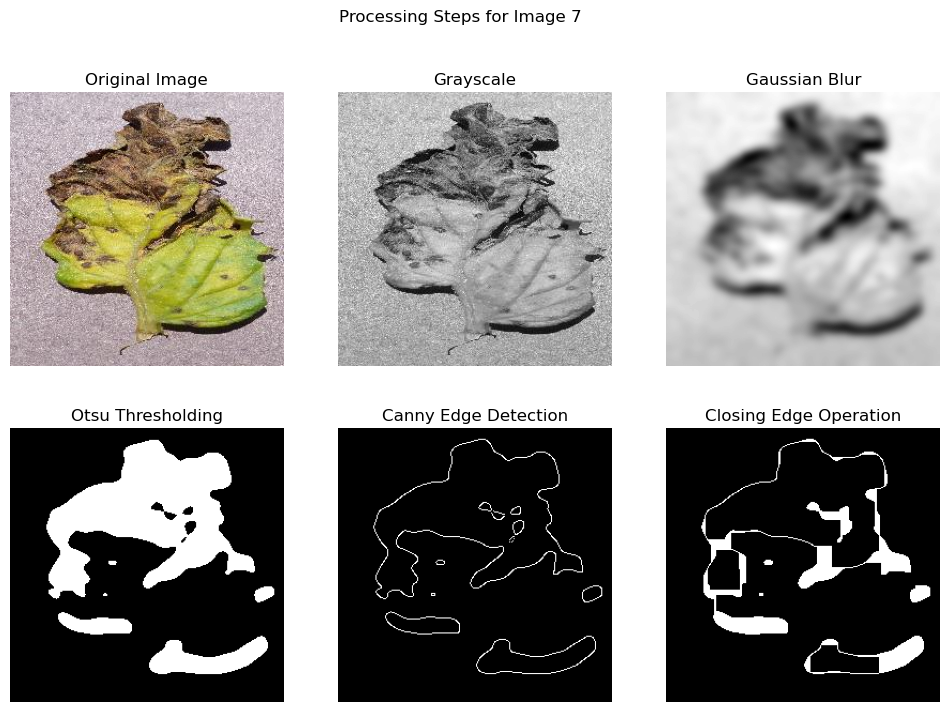

Processing image 8: C:\Users\jithi\Downloads\images for intials\f9095543-43a8-4dac-8d06-041203fa5af5___RS_Erly.B 6435.JPG


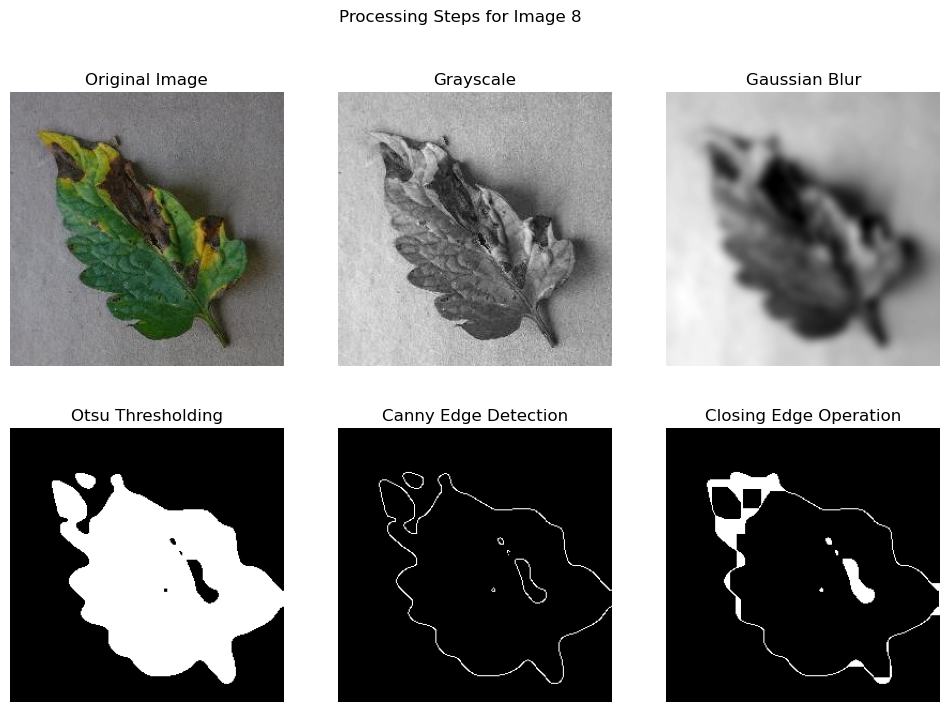

Processing image 9: C:\Users\jithi\Downloads\images for intials\f91230c1-b28c-46fe-ab7a-329fdb689a02___RS_Erly.B 9439_180deg.JPG


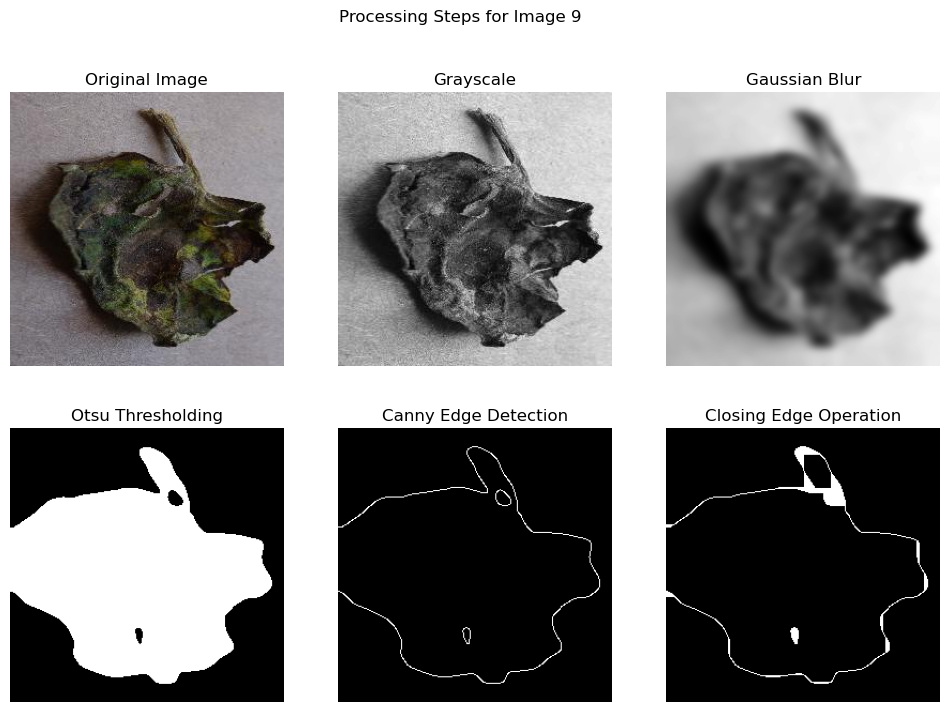

Processing image 10: C:\Users\jithi\Downloads\images for intials\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340.JPG


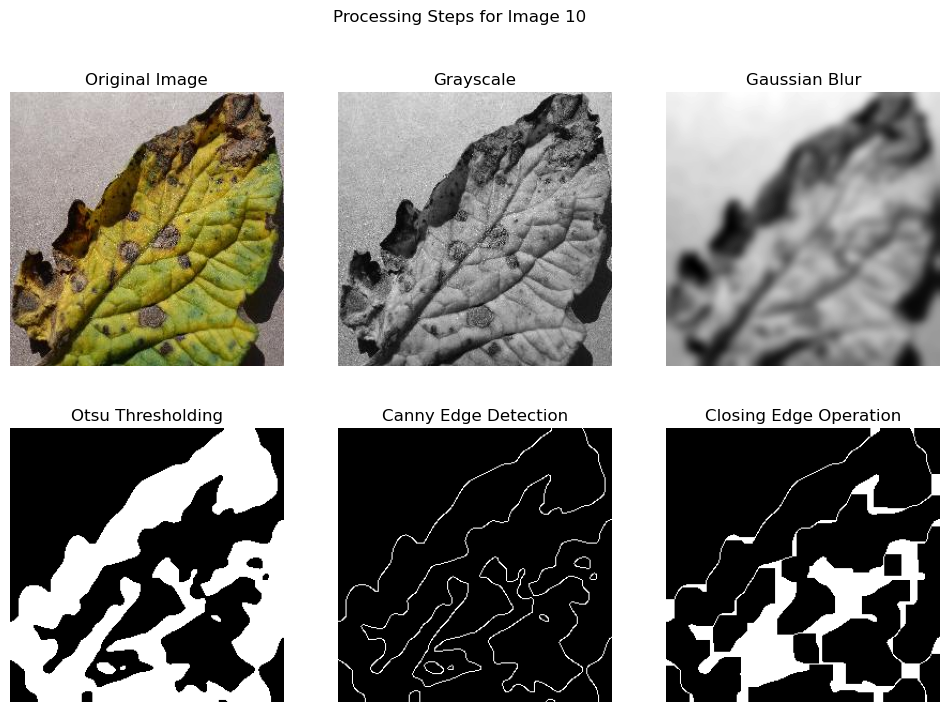

Processing image 11: C:\Users\jithi\Downloads\images for intials\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340_180deg.JPG


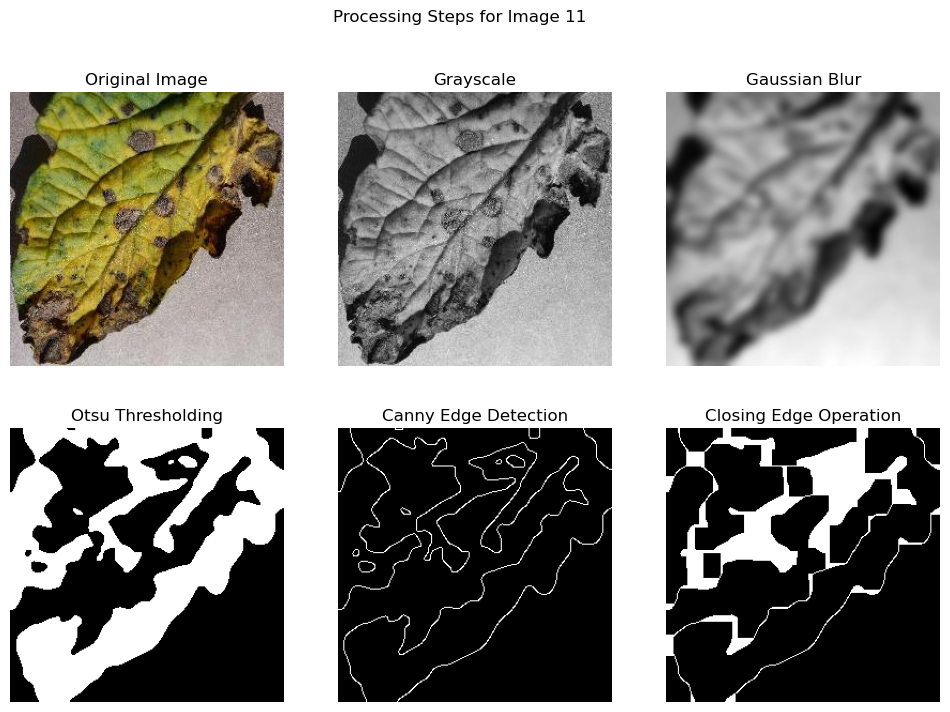

Processing image 12: C:\Users\jithi\Downloads\images for intials\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340_flipTB.JPG


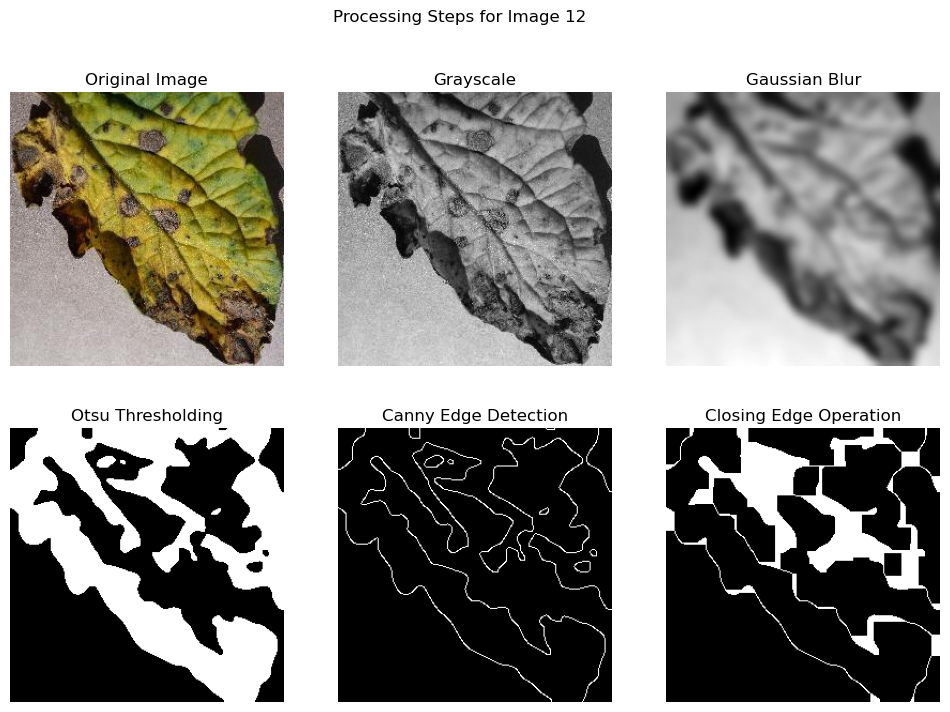

Processing image 13: C:\Users\jithi\Downloads\images for intials\ff82087d-e992-41fb-a2ec-f726d92e6c58___GHLB_PS Leaf 27 day 13.jpg


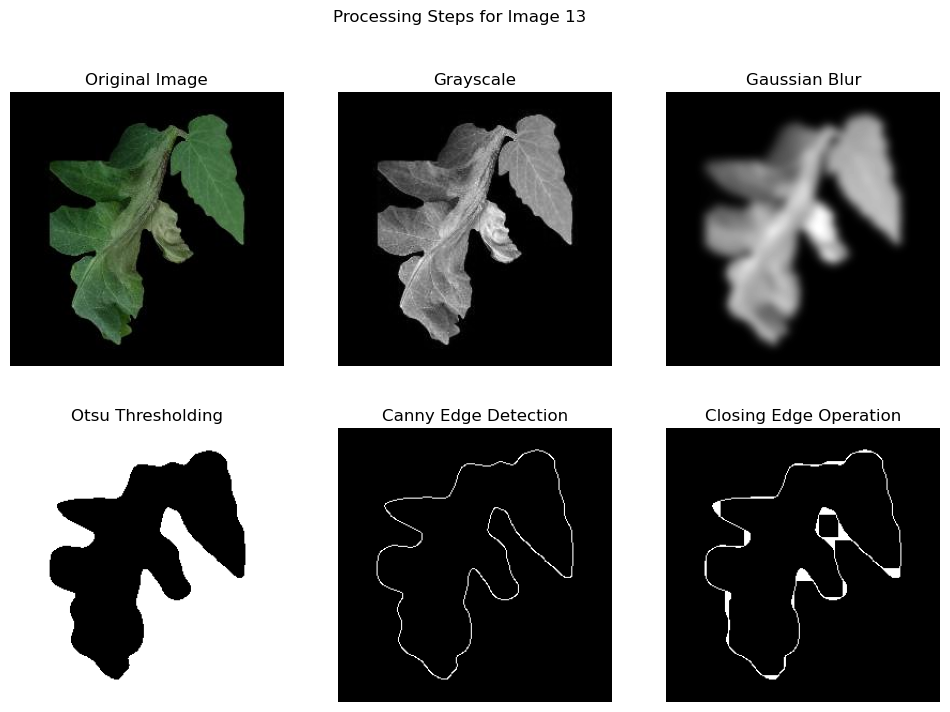

Processing image 14: C:\Users\jithi\Downloads\images for intials\ffe98ff9-be33-4e8f-82f0-7b7c21b02958___JR_Sept.L.S 8455.JPG


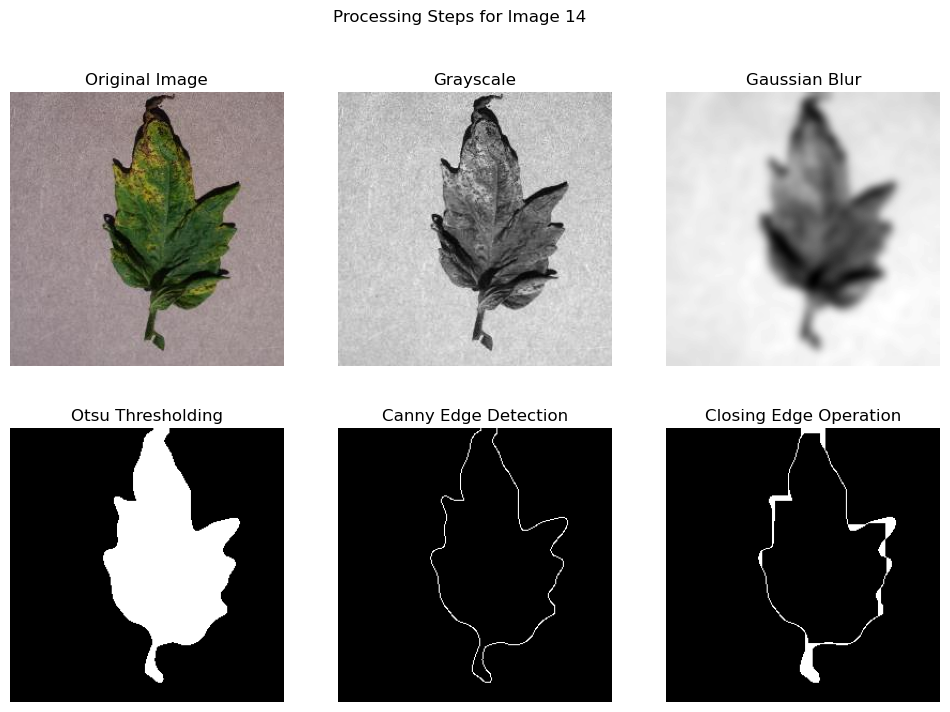

Processing image 15: C:\Users\jithi\Downloads\images for intials\fffee500-8469-4c0f-a17d-d95c5516b446___Matt.S_CG 6210.JPG


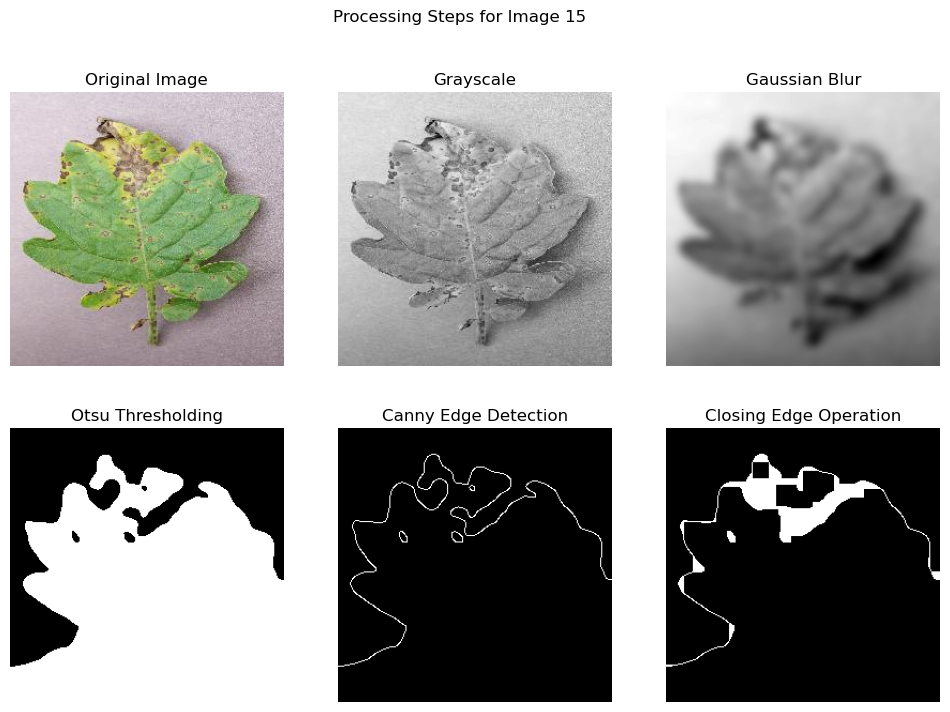

In [45]:
def preprocess_images(img_mask):
    # This function loads and preprocesses images
    preprocessed_data = []
    img_names = glob(img_mask)

    for idx, fn in enumerate(img_names):
        print(f"Processing image {idx + 1}: {fn}")
        
        img = cv2.imread(fn)
        
        if img is None:
            print(f"Error loading image: {fn}")
            continue  # Skip this image if it cannot be loaded
        
        # Convert the image to grayscale
        gs = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(gs, (25, 25), 0)
        
        # Adaptive image thresholding using Otsu's thresholding
        _, im_bw_otsu = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        # Canny edge detection
        canny_edge = cv2.Canny(im_bw_otsu, threshold1=50, threshold2=100)
        
        # Morphological closing operation
        kernel_edge = np.ones((15, 15), np.uint8)  # Define a kernel
        closing_edge = cv2.morphologyEx(canny_edge, cv2.MORPH_CLOSE, kernel_edge)
        
        preprocessed_data.append((img, gs, im_bw_otsu, closing_edge))
        
        # Plot the intermediate steps
        plt.figure(figsize=(12, 8))
        
        # Original image
        plt.subplot(2, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')
        
        # Grayscale
        plt.subplot(2, 3, 2)
        plt.imshow(gs, cmap='gray')
        plt.title("Grayscale")
        plt.axis('off')
        
        # Gaussian Blur
        plt.subplot(2, 3, 3)
        plt.imshow(blur, cmap='gray')
        plt.title("Gaussian Blur")
        plt.axis('off')
        
        # Otsu Thresholding
        plt.subplot(2, 3, 4)
        plt.imshow(im_bw_otsu, cmap='gray')
        plt.title("Otsu Thresholding")
        plt.axis('off')
        
        # Canny Edge Detection
        plt.subplot(2, 3, 5)
        plt.imshow(canny_edge, cmap='gray')
        plt.title("Canny Edge Detection")
        plt.axis('off')
        
        # Closing Edge Operation
        plt.subplot(2, 3, 6)
        plt.imshow(closing_edge, cmap='gray')
        plt.title("Closing Edge Operation")
        plt.axis('off')
        
        plt.suptitle(f"Processing Steps for Image {idx + 1}")
        plt.show()
        
    return preprocessed_data

img_mask = r"C:\Users\jithi\Downloads\images for intials\*.jpg"  

preprocessed_data = preprocess_images(img_mask)


In [46]:
!pip install mahotas

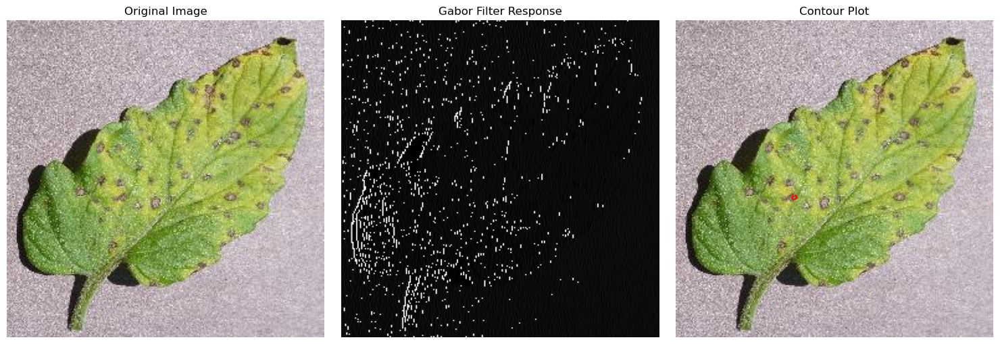

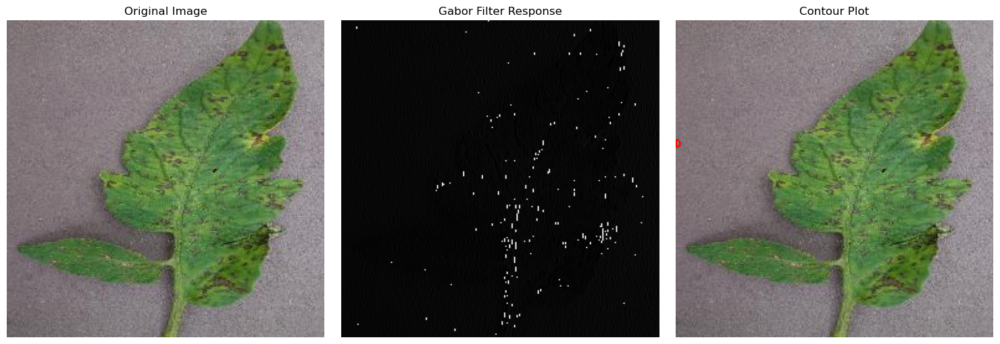

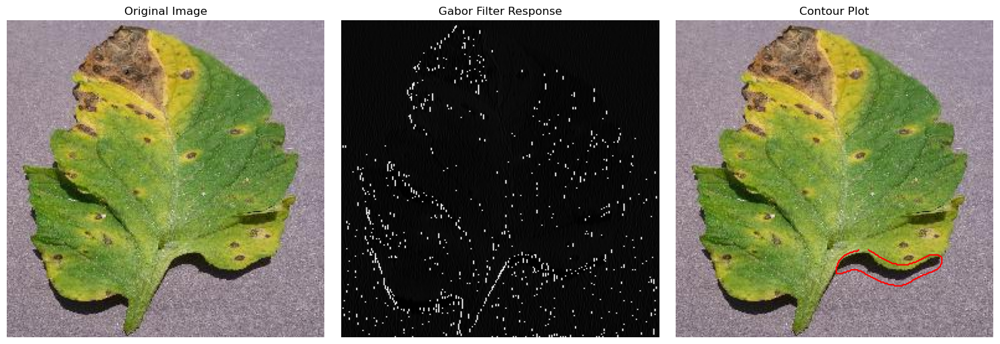

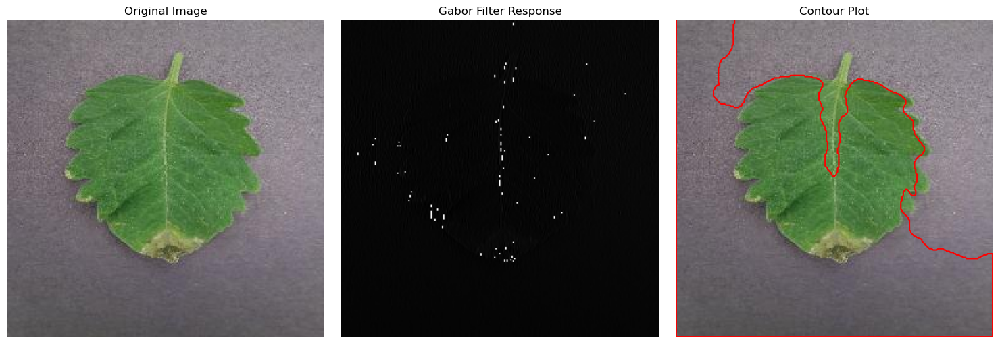

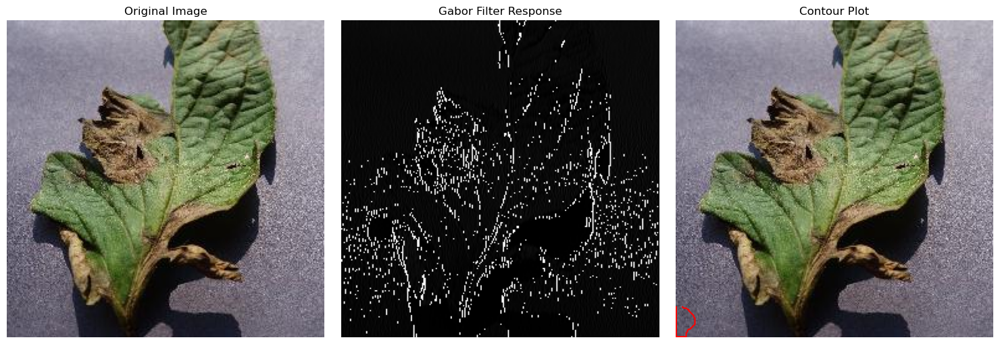

...

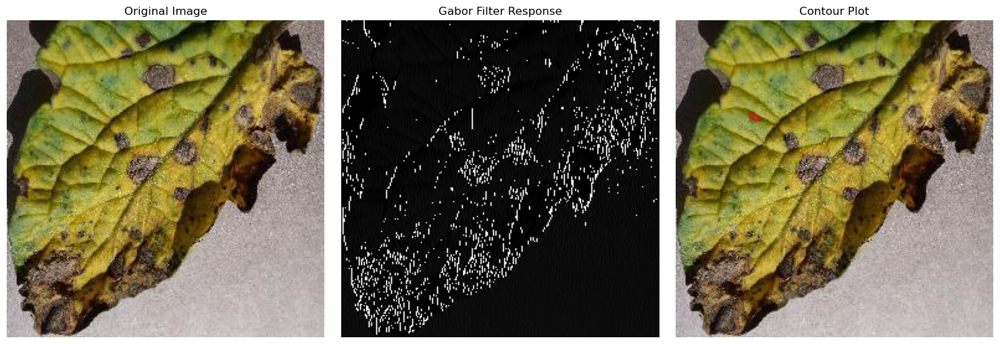

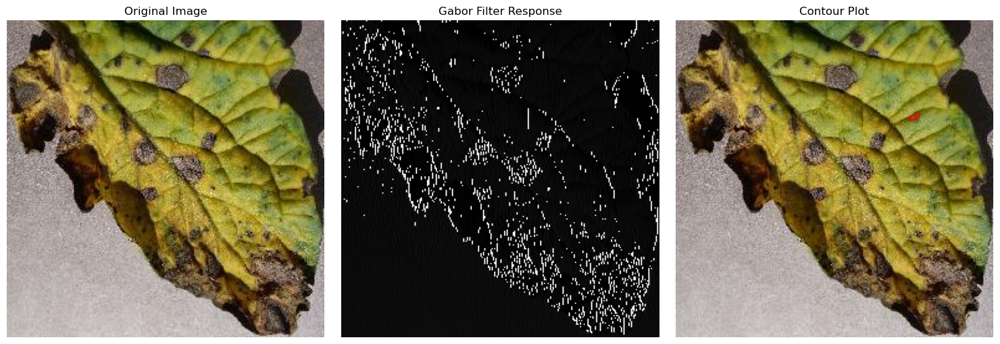

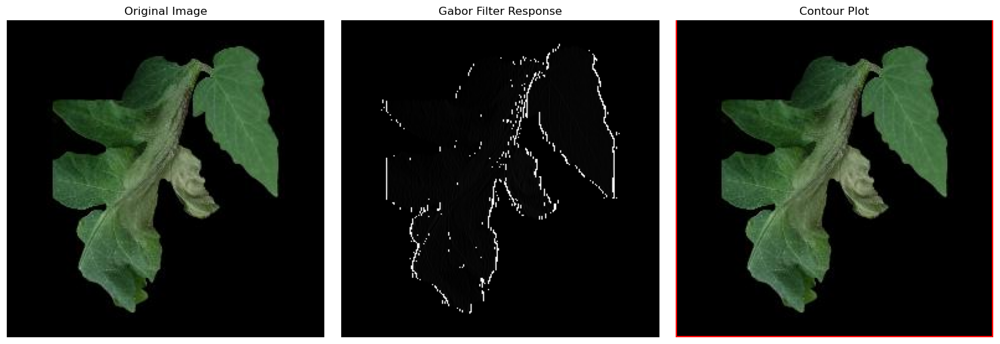

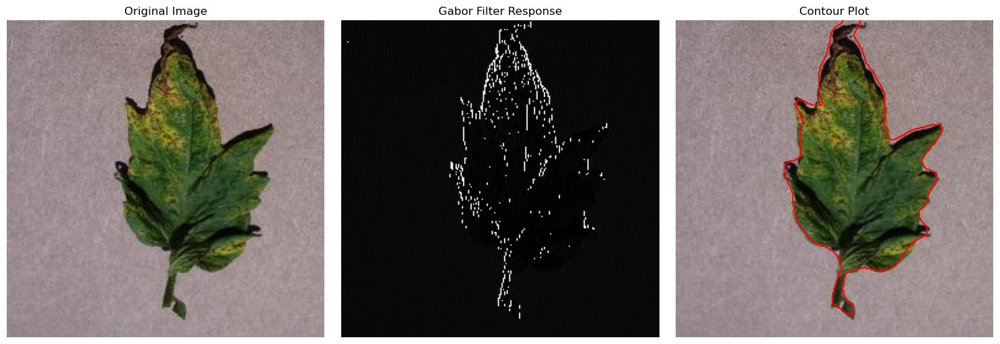

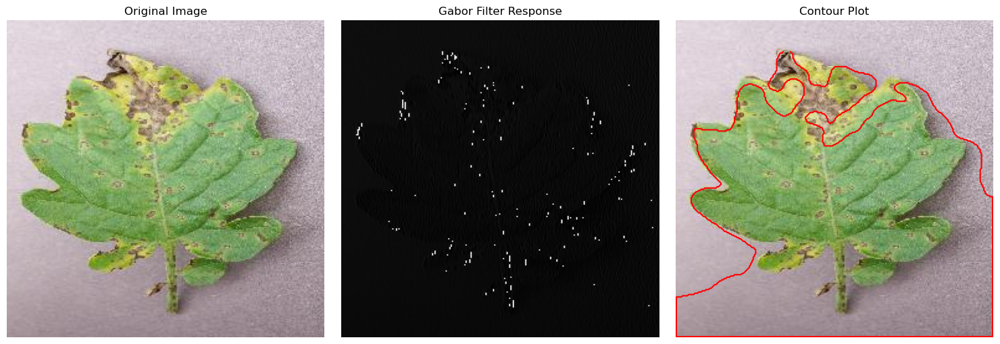

gaborenergy: [0.14760678866878152, 0.24636961240321398, 0.18635688070207834, 0.307054893579334, 0.22633533366024494, 0.20023416727781296, 0.1537017896771431, 0.2814050232991576, 0.28176998998969793, 0.18966719880700111, 0.18961543031036854, 0.18960290728136897, 0.7603015126660466, 0.2897190689109266, 0.16832992294803262]
gaborentropy: [2.86673109483765, 2.2281524153712398, 2.6063203475781997, 1.9477018484853599, 2.419640811447368, 2.607842521321337, 2.828902162292753, 2.0016666718557454, 2.0612953933745963, 2.628579514844976, 2.6287816293276647, 2.6288139909649693, 0.7833487698439386, 2.074651709912098, 2.750841889000614]
width: [5, 4, 86, 256, 16, 256, 111, 217, 245, 5, 9, 9, 256, 128, 256]
Length: [4, 7, 30, 256, 25, 243, 36, 196, 221, 4, 6, 6, 256, 238, 231]
area: [9.0, 14.5, 1321.0, 43901.0, 278.5, 44541.5, 2041.5, 23893.0, 31595.5, 10.0, 24.5, 24.5, 65025.0, 14951.0, 42527.0]
Rect_Area: [20, 28, 2580, 65536, 400, 62208, 3996, 42532, 54145, 20, 54, 54, 65536, 30464, 59136]
perimete

In [47]:
from skimage.filters import gabor
from skimage.feature import local_binary_pattern
import mahotas as mt
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_features(preprocessed_data):
    # Initialize empty lists for each feature
    feature_data = {
        'gaborenergy': [], 'gaborentropy': [], 'width': [], 'Length': [], 
        'area': [], 'Rect_Area': [], 'perimeter': [], 'Extent': [], 
        'Solidity': [], 'Hull_Area': [], 'AspectRatio': [], 'Rectangularity': [], 
        'Circularity': [], 'EquiDiameter': [], 'RedMean': [], 'GreenMean': [], 
        'BlueMean': [], 'RedVar': [], 'GreenVar': [], 'BlueVar': [], 
        'contrast': [], 'correlation': [], 'inverse_difference_moments': [], 
        'entropy': [], 'LBP': []
    }
    
    radius = 3
    no_points = 8 * radius

    for img, gs, im_bw_otsu, closing_edge in preprocessed_data:
        # Gabor filter processing
        gaborFilt_real, gaborFilt_imag = gabor(gs, frequency=0.6)
        gaborFilt = (gaborFilt_real ** 2 + gaborFilt_imag ** 2) // 2
        gabor_hist, _ = np.histogram(gaborFilt, 8)
        gabor_prob = np.divide(gabor_hist, np.sum(gabor_hist))
        gabor_energy = np.sum(gabor_prob ** 2)
        gabor_entropy = -np.sum(np.multiply(gabor_prob, np.log2(gabor_prob + 1e-10)))  # Avoid log(0)

        feature_data['gaborenergy'].append(gabor_energy)
        feature_data['gaborentropy'].append(gabor_entropy)

        # Local Binary Pattern (LBP)
        lbp = local_binary_pattern(gs, no_points, radius, method='uniform')
        feature_data['LBP'].append(lbp)
        
        # Shape and color features extraction
        contours, _ = cv2.findContours(im_bw_otsu, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            cnt = contours[0]
            area = cv2.contourArea(cnt)
            perimeter = cv2.arcLength(cnt, True)
            x, y, w, h = cv2.boundingRect(cnt)
            rect_area = w * h
            aspect_ratio = float(w) / h if h != 0 else 0
            extent = float(area) / rect_area if rect_area != 0 else 0
            hull = cv2.convexHull(cnt)
            hull_area = cv2.contourArea(hull)
            solidity = float(area) / hull_area if hull_area != 0 else 0
            rectangularity = (w * h) / area if area != 0 else 0
            circularity = ((perimeter) ** 2) / area if area != 0 else 0
            equi_diameter = np.sqrt(4 * area / np.pi)
            
            # Adding extracted shape-based features to lists
            feature_data['area'].append(area)
            feature_data['perimeter'].append(perimeter)
            feature_data['Rect_Area'].append(rect_area)
            feature_data['AspectRatio'].append(aspect_ratio)
            feature_data['Extent'].append(extent)
            feature_data['Solidity'].append(solidity)
            feature_data['Rectangularity'].append(rectangularity)
            feature_data['Circularity'].append(circularity)
            feature_data['EquiDiameter'].append(equi_diameter)
            feature_data['width'].append(w)
            feature_data['Length'].append(h)
            feature_data['Hull_Area'].append(hull_area)
        
            # Plot the original image, Gabor filter response, and contours
            plt.figure(figsize=(15, 5))

            # Plot Original Image
            plt.subplot(1, 3, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')

            # Plot Gabor Filter Response
            plt.subplot(1, 3, 2)
            plt.imshow(gaborFilt_real, cmap='gray')
            plt.title('Gabor Filter Response')
            plt.axis('off')

            # Plot Contours
            plt.subplot(1, 3, 3)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Contour Plot')
            plt.axis('off')
            plt.plot(cnt[:, 0, 0], cnt[:, 0, 1], color='red')  # Draw contours

            plt.tight_layout()
            plt.show()

        # Color features
        for i, color_channel in enumerate(['RedMean', 'GreenMean', 'BlueMean']):
            color = img[:, :, i]
            mean_value = np.mean(color[color != 255])
            feature_data[f'{color_channel}'].append(mean_value)

            # Initialize variance feature keys
            feature_data[f'{color_channel[0]}Var'] = []
            std_value = np.std(color[color != 255])
            feature_data[f'{color_channel[0]}Var'].append(std_value)

        # Texture features using Haralick
        textures = mt.features.haralick(gs).mean(axis=0)
        feature_data['contrast'].append(textures[1])
        feature_data['correlation'].append(textures[2])
        feature_data['inverse_difference_moments'].append(textures[4])
        feature_data['entropy'].append(textures[8])

    # Print the feature values
    for feature_name, values in feature_data.items():
        print(f"{feature_name}: {values}")

    return feature_data



# Extract features from preprocessed data
features = extract_features(preprocessed_data)

In [48]:
import pandas as pd

def save_features_to_csv(feature_data, label, filename="Labled_DATAUpdate1.csv"):
    # Add labels to the data
    feature_data['Label'] = [label] * len(feature_data['gaborenergy'])
    
    # Create a DataFrame
    df = pd.DataFrame(feature_data) 
    
    # View the DataFrame output
    print(df)
    
    # Save the DataFrame to a CSV file
    df.to_csv(filename, index=False)
    print(f"Features saved to {filename}")

In [49]:
import pandas as pd

# Ensure all feature lists in 'features' have the same length
min_length = min(len(values) for values in features.values())
for feature_name, values in features.items():
    if len(values) > min_length:
        features[feature_name] = values[:min_length]

# Create a DataFrame from the truncated 'features' dictionary
df = pd.DataFrame(features)

# Display the DataFrame
print("Extracted Features DataFrame:")
print(df)

# Save to CSV if needed
df.to_csv("Labeled_DATAUpdate1.csv", index=False)
print("\nDataFrame saved to Labeled_DATAUpdate1.csv")

Extracted Features DataFrame:
Empty DataFrame
Columns: [gaborenergy, gaborentropy, width, Length, area, Rect_Area, perimeter, Extent, Solidity, Hull_Area, AspectRatio, Rectangularity, Circularity, EquiDiameter, RedMean, GreenMean, BlueMean, RedVar, GreenVar, BlueVar, contrast, correlation, inverse_difference_moments, entropy, LBP, RVar, GVar, BVar]
Index: []

[0 rows x 28 columns]

DataFrame saved to Labeled_DATAUpdate1.csv
